### author by yangshichen
### 注意：脚本仅供参考，使用前请仔细阅读

### 调用GPU

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import seaborn as sb
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
from scipy.io import mmread
from scipy.sparse import csr_matrix
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

import warnings
warnings.filterwarnings("ignore")

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, frameon=False)
sc._settings.ScanpyConfig.n_jobs=70

scanpy==1.9.3 anndata==0.8.0 numpy==1.21.6 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.8 pynndescent==0.5.13


In [3]:
cluster_cols = ["#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72", 
                "#B17BA6", "#FF7F00", "#FDB462", "#E7298A", "#E78AC3", 
                "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D", 
                "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999", 
                "#aa8282", "#d4b7b7", "#8600bf", "#ba5ce3", "#808000", 
                "#aeae5c", "#1e90ff", "#00bfff", "#56ff0d", "#ffff00"]

### INRs-associated Inflammatory Module

In [4]:
adata = sc.read("/media/AnalysisDisk2/Yangshichen/0_HIV_RNA/HIV-pbmc/CD4_celltype.h5ad")
adata

AnnData object with n_obs × n_vars = 645339 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'celltype_L1', 'phase_ordered', 'leiden_r2.2_n2', 'celltype_L3'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'cosg', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_colors', 'leiden_r2.0_n2_colors', 'leiden_r2.2_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'rank_genes_groups', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivitie

In [5]:
gene_list = ['ABCA1','ABI1','ACVR1B','ACVR2A','ADM','ADORA2B','ADRM1','AHR','APLNR','AQP9','ATP2A2','ATP2B1','ATP2C1','AXL','BDKRB1','BEST1','BST2','BTG2','C3AR1','C5AR1','CALCRL','CCL17','CCL2','CCL20','CCL22','CCL24','CCL5','CCL7','CCR7','CCRL2','CD14','CD40','CD48','CD55','CD69','CD70','CD82','CDKN1A','CHST2','CLEC5A','CMKLR1','CSF1','CSF3','CSF3R','CX3CL1','CXCL10','CXCL11','CXCL6','CXCL9','CXCR6','CYBB','DCBLD2','EBI3','EDN1','EIF2AK2','EMP3','EMR1','EREG','F3','FFAR2','FPR1','FZD5','GABBR1','GCH1','GNA15','GNAI3','GP1BA','GPC3','GPR132','GPR183','HAS2','HBEGF','HIF1A','HPN','HRH1','ICAM1','ICAM4','ICOSLG','IFITM1','IFNAR1','IFNGR2','IL10','IL10RA','IL12B','IL15','IL15RA','IL18','IL18R1','IL18RAP','IL1A','IL1B','IL1R1','IL2RB','IL4R','IL6','IL7R','IL8','INHBA','IRAK2','IRF1','IRF7','ITGA5','ITGB3','ITGB8','KCNA3','KCNJ2','KCNMB2','KIF1B','KLF6','LAMP3','LCK','LCP2','LDLR','LIF','LPAR1','LTA','LY6E','LYN','MARCO','MEFV','MEP1A','MET','MMP14','MSR1','MXD1','MYC','NAMPT','NDP','NFKB1','NFKBIA','NLRP3','NMI','NMUR1','NOD2','NPFFR2','OLR1','OPRK1','OSM','OSMR','P2RX4','P2RX7','P2RY2','PCDH7','PDE4B','PDPN','PIK3R5','PLAUR','PROK2','PSEN1','PTAFR','PTGER2','PTGER4','PTGIR','PTPRE','PVR','RAF1','RASGRP1','RELA','RGS1','RGS16','RHOG','RIPK2','RNF144B','ROS1','RTP4','SCARF1','SCN1B','SELE','SELL','SELS','SEMA4D','SERPINE1','SGMS2','SLAMF1','SLC11A2','SLC1A2','SLC28A2','SLC31A1','SLC31A2','SLC4A4','SLC7A1','SLC7A2','SPHK1','SRI','STAB1','TACR1','TACR3','TAPBP','TIMP1','TLR1','TLR2','TLR3','TNFAIP6','TNFRSF1B','TNFRSF9','TNFSF10','TNFSF15','TNFSF9','TPBG','VIP','ADAR','APOL6','ARID5B','ARL4A','AUTS2','B2M','BANK1','BATF2','BPGM','BTG1','C1R','C1S','CASP1','CASP3','CASP4','CASP7','CASP8','CD274','CD38','CD74','CD86','CFB','CFH','CIITA','CMPK2','CSF2RB','DDX58','DDX60','DHX58','EIF4E3','EPSTI1','FAS','FCGR1A','FGL2','FTSJD2','GBP4','GBP6','GPR18','GZMA','HERC6','HLA-A','HLA-B','HLA-DMA','HLA-DQA1','HLA-DRB1','HLA-G','IDO1','IFI27','IFI30','IFI35','IFI44','IFI44L','IFIH1','IFIT1','IFIT2','IFIT3','IFITM2','IFITM3','IFNAR2','IL18BP','IL7','IRF2','IRF4','IRF5','IRF8','IRF9','ISG15','ISG20','ISOC1','ITGB7','JAK2','KLRK1','LAP3','LATS2','LGALS3BP','LYSMD2','1-Mar','METTL7B','MT2A','MTHFD2','MVP','MX1','MX2','MYD88','NCOA3','NLRC5','NOD1','NUP93','OAS2','OAS3','OASL','OGFR','P2RY14','PARP12','PARP14','PELI1','PFKP','PIM1','PLA2G4A','PLSCR1','PML','PNP','PNPT1','PRIC285','PSMA2','PSMA3','PSMB10','PSMB2','PSMB8','PSMB9','PSME1','PSME2','PTGS2','PTPN1','PTPN2','PTPN6','RAPGEF6','RBCK1','RIPK1','RNF213','RNF31','RSAD2','SAMD9L','SAMHD1','SECTM1','SELP','SERPING1','SLAMF7','SLC25A28','SOCS1','SOCS3','SOD2','SP110','SPPL2A','SSPN','ST3GAL5','ST8SIA4','STAT1','STAT2','STAT3','STAT4','TAP1','TDRD7','TNFAIP2','TNFAIP3','TOR1B','TRAFD1','TRIM14','TRIM21','TRIM25','TRIM26','TXNIP','UBE2L6','UPP1','USP18','VAMP5','VAMP8','VCAM1','WARS','XAF1','XCL1','ZBP1','ZNFX1','AREG','ATF3','B4GALT1','B4GALT5','BCL2A1','BCL3','BCL6','BHLHE40','BIRC2','BIRC3','BMP2','BTG3','CCL4','CCND1','CCNL1','CD44','CD80','CD83','CEBPB','CEBPD','CFLAR','CLCF1','CSF2','CXCL1','CXCL2','CXCL3','CXCR7','CYR61','DENND5A','DNAJB4','DRAM1','DUSP1','DUSP2','DUSP4','DUSP5','EFNA1','EGR1','EGR2','EGR3','EHD1','EIF1','ETS2','F2RL1','FJX1','FOS','FOSB','FOSL1','FOSL2','FUT4','G0S2','GADD45A','GADD45B','GEM','GFPT2','HES1','ID2','IER2','IER3','IER5','IL23A','IL6ST','IRS2','JAG1','JUN','JUNB','KDM6B','KLF10','KLF2','KLF4','KLF9','KYNU','LAMB3','LITAF','MAFF','MAP2K3','MAP3K8','MARCKS','MCL1','MSC','NFAT5','NFE2L2','NFIL3','NFKB2','NFKBIE','NINJ1','NR4A1','NR4A2','NR4A3','PANX1','PDLIM5','PER1','PFKFB3','PHLDA1','PHLDA2','PLAU','PLEK','PLK2','PMEPA1','PNRC1','PPAP2B','PPP1R15A','PTX3','RCAN1','REL','RELB','RHOB','RNF19B','SAT1','SDC4','SERPINB2','SERPINB8','SGK1','SIK1','SLC16A6','SLC2A3','SLC2A6','SMAD3','SNN','SPSB1','SQSTM1','STAT5A','TANK','TGIF1','TIPARP','TNC','TNF','TNFAIP8','TNIP1','TNIP2','TRAF1','TRIB1','TRIP10','TSC22D1','TUBB2A','VEGFA','YRDC','ZBTB10','ZC3H12A','ZFP36','HLA-DPB1','HLA-DRA','HLA-DPA1','HLA-DRB5','TTN','CCDC141','IKZF2','RTKN2','PMAIP1','NIBAN1','HLA-DQB1','ADD1','AIFM3','ANKH','ANXA1','APP','AVPR1A','BAX','BCAP31','BCL10','BCL2L1','BCL2L10','BCL2L11','BCL2L2','BGN','BID','BIK','BMF','BNIP3L','BRCA1','CASP2','CASP6','CASP9','CAV1','CCNA1','CCND2','CD2','CDC25B','CDK2','CDKN1B','CLU','CREBBP','CTH','CTNNB1','CYLD','DAP','DAP3','DCN','DDIT3','DFFA','DIABLO','DNAJA1','DNAJC3','DNM1L','DPYD','EBP','EMP1','ENO2','ERBB2','ERBB3','ETF1','F2','F2R','FASLG','FDXR','FEZ1','GPX1','GPX3','GPX4','GSN','GSR','GSTM1','GUCY2D','H1F0','HGF','HMGB2','HMOX1','HSPB1','IFNB1','IFNGR1','IGF2R','IGFBP6','KRT18','LEF1','LGALS3','LMNA','LPPR4','LUM','MADD','MGMT','MMP2','NEDD9','NEFH','PAK1','PDCD4','PDGFRB','PEA15','PLAT','PLCB2','PPP2R5B','PPP3R1','PPT1','PRF1','PSEN2','PTK2','RARA','RETSAT','RHOT2','RNASEL','ROCK1','SATB1','SC5DL','SLC20A1','SMAD7','SOD1','SPTAN1','TGFB2','TGFBR3','TIMP2','TIMP3','TNFRSF12A',
             'TOP2A','TSPO','VDAC2','WEE1','XIAP']

In [6]:
sc.tl.score_genes(adata, gene_list, score_name = 'Inflammatory Module')

computing score 'Inflammatory Module'
    finished: added
    'Inflammatory Module', score of gene set (adata.obs).
    1164 total control genes are used. (0:00:18)


In [7]:
gene_set_df=adata.obs[["sample","stage","celltype_L3", 'Inflammatory Module']]
gene_set_df

,sample,stage,celltype_L3,Inflammatory Module
cellbarcode,,,,
HD-H134-1-CELL4_N1,HD-H134,HDs,CD4_Treg-FOXP3,0.157667
HD-H134-1-CELL24_N1,HD-H134,HDs,CD4_Naive_T-CCR7,0.050298
HD-H134-1-CELL55_N1,HD-H134,HDs,CD4_Treg-FOXP3,0.221720
HD-H134-1-CELL85_N1,HD-H134,HDs,CD4_Tcm-CXCR5,0.080775
HD-H134-1-CELL101_N2,HD-H134,HDs,CD4_Th22-CCR10,0.149019
...,...,...,...,...
PD-H267-2-CELL9669_N1,PD-H267,IRs,CD4_Th1-GZMK,0.154606
PD-H267-2-CELL9853_N1,PD-H267,IRs,CD4_Tcm-GPR183,0.073148
PD-H267-2-CELL11138_N1,PD-H267,IRs,CD4_Th22-CCR10,0.127584


In [8]:
gene_set_df.groupby(["stage", "celltype_L3"])["Inflammatory Module"].mean().reset_index()

,stage,celltype_L3,Inflammatory Module
0,HDs,CD4_Naive_T-CCR7,0.095773
1,HDs,CD4_Tem-CCR7neg,0.112565
2,HDs,CD4_Naive_T-SOX4,0.084494
3,HDs,CD4_Th22-CCR10,0.158625
4,HDs,CD4_Th17-RORC,0.161909
5,HDs,CD4_Tcm-CXCR5,0.112800
6,HDs,CD4_Tfh_like-CXCR5,0.145882
7,HDs,CD4_Tcm-SOX4,0.125968
8,HDs,CD4_Tcm-GPR183,0.122563
9,HDs,CD4_Treg-FOXP3,0.170161


In [9]:
gene_set_df.to_csv('/media/AnalysisDisk2/Yangshichen/0_HIV_RNA/PathwayScore/数据导出/CD4/CD4-Inflammatory Module.csv', index=True)

### 基因表达

In [7]:
adata = sc.read("/media/AnalysisDisk2/Yangshichen/0_HIV_RNA/HIV-pbmc/CD4_celltype.h5ad")
adata = adata[adata.obs["celltype_L3"] == "CD4_Naive_T-CCR7"].copy()
adata

AnnData object with n_obs × n_vars = 197316 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'celltype_L1', 'phase_ordered', 'leiden_r2.2_n2', 'celltype_L3'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'cosg', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_colors', 'leiden_r2.0_n2_colors', 'leiden_r2.2_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'rank_genes_groups', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivitie

In [18]:
adata.X = adata.layers['counts'].copy()

In [19]:
genes = ["CEBPA","CEBPB","CEBPD","ETV7","IRF5","KLF4",
         "LYL1","RARA","RXRA","SPI1","STAT1","STAT2"]

X_sub = adata[:, genes].to_df()  # 直接转成 DataFrame，比逐个基因快很多
X_sub

gene_id,CEBPA,CEBPB,CEBPD,ETV7,IRF5,KLF4,LYL1,RARA,RXRA,SPI1,STAT1,STAT2
cellbarcode,,,,,,,,,,,,
HD-H134-1-CELL24_N1,0,0,0,0,0,0,0,0,0,0,0,0
HD-H134-1-CELL103_N1,0,0,0,0,0,0,0,0,0,0,0,0
HD-H134-1-CELL104_N1,0,0,0,0,0,0,0,0,0,0,3,0
HD-H134-1-CELL180_N1,0,0,0,0,0,0,0,0,0,0,0,0
HD-H134-1-CELL287_N1,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
PD-H260-2-CELL7608_N1,0,0,0,0,0,0,0,0,0,0,0,0
PD-H260-2-CELL8410_N1,0,0,0,0,0,0,0,0,0,0,0,0
PD-H260-2-CELL10488_N1,0,0,0,0,0,0,0,0,0,0,2,0


In [20]:
X_sub["stage"] = adata.obs["stage"].values
X_sub["sample"] = adata.obs["sample"].values
X_sub

gene_id,CEBPA,CEBPB,CEBPD,ETV7,IRF5,KLF4,LYL1,RARA,RXRA,SPI1,STAT1,STAT2,stage,sample
cellbarcode,,,,,,,,,,,,,,
HD-H134-1-CELL24_N1,0,0,0,0,0,0,0,0,0,0,0,0,HDs,HD-H134
HD-H134-1-CELL103_N1,0,0,0,0,0,0,0,0,0,0,0,0,HDs,HD-H134
HD-H134-1-CELL104_N1,0,0,0,0,0,0,0,0,0,0,3,0,HDs,HD-H134
HD-H134-1-CELL180_N1,0,0,0,0,0,0,0,0,0,0,0,0,HDs,HD-H134
HD-H134-1-CELL287_N1,0,0,0,0,0,0,0,0,0,0,0,0,HDs,HD-H134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PD-H260-2-CELL7608_N1,0,0,0,0,0,0,0,0,0,0,0,0,INRs,PD-H260
PD-H260-2-CELL8410_N1,0,0,0,0,0,0,0,0,0,0,0,0,INRs,PD-H260
PD-H260-2-CELL10488_N1,0,0,0,0,0,0,0,0,0,0,2,0,INRs,PD-H260


In [21]:
X_sub.to_csv("/media/AnalysisDisk2/Yangshichen/0_HIV_RNA/SAIGEQTL/Integrative_analysis/TF/tf_gene_expression2.csv", index=True)

### 聚类分群

In [6]:
adata = sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/CD4_filter.h5ad")
adata.X = adata.layers['counts'].copy()
adata

AnnData object with n_obs × n_vars = 645339 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'

In [7]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,batch_key="stage")
adata.var.highly_variable.value_counts()

normalizing counts per cell
    finished (0:01:07)
extracting highly variable genes
    finished (0:00:31)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


False    17824
True      3855
Name: highly_variable, dtype: int64

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:04:04)


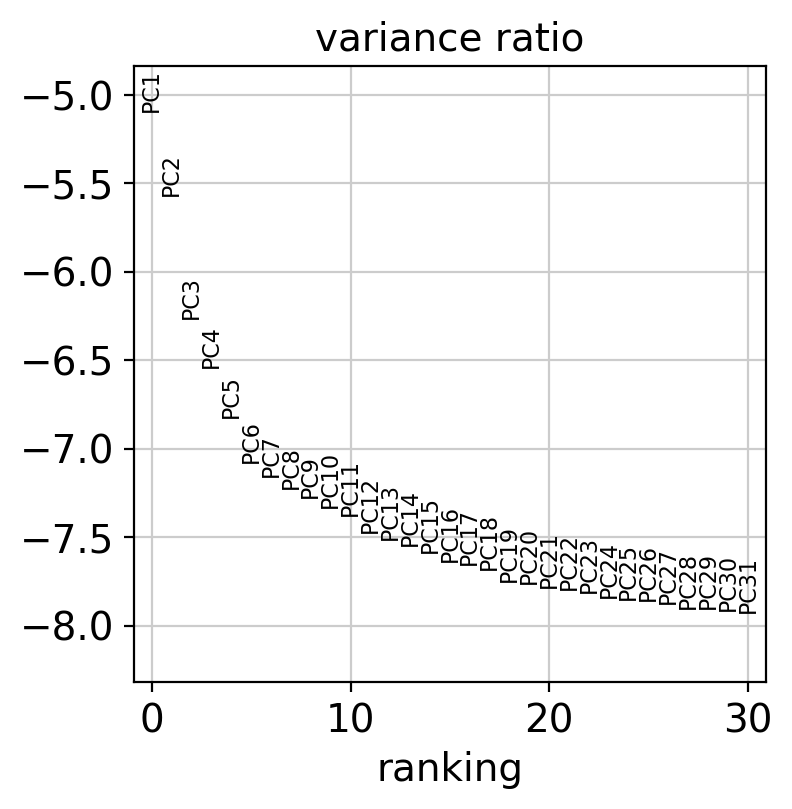

In [8]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack',n_comps=50,use_highly_variable=True)
sc.pl.pca_variance_ratio(adata,n_pcs=30,log=True)

In [9]:
rsc.pp.harmony_integrate(adata,key='experiments',max_iter_harmony = 30)

2024-05-14 09:39:40,013 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-14 09:40:25,967 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-14 09:41:11,827 - harmonypy_gpu - INFO - Iteration 3 of 30
2024-05-14 09:41:57,666 - harmonypy_gpu - INFO - Converged after 3 iterations


In [104]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=18, use_rep='X_pca_harmony')
sc.tl.umap(adata,min_dist = 0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:03:21)
computing UMAP


IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:18:25)


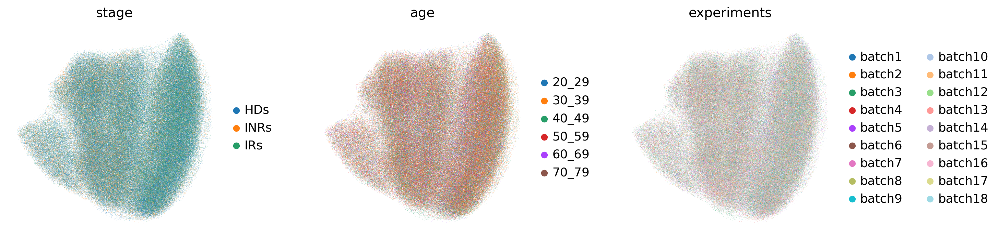

In [105]:
sc.pl.umap(adata, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering


IOStream.flush timed out


    finished: found 18 clusters and added
    'leiden_r1.8_n2', the cluster labels (adata.obs, categorical) (0:03:13)


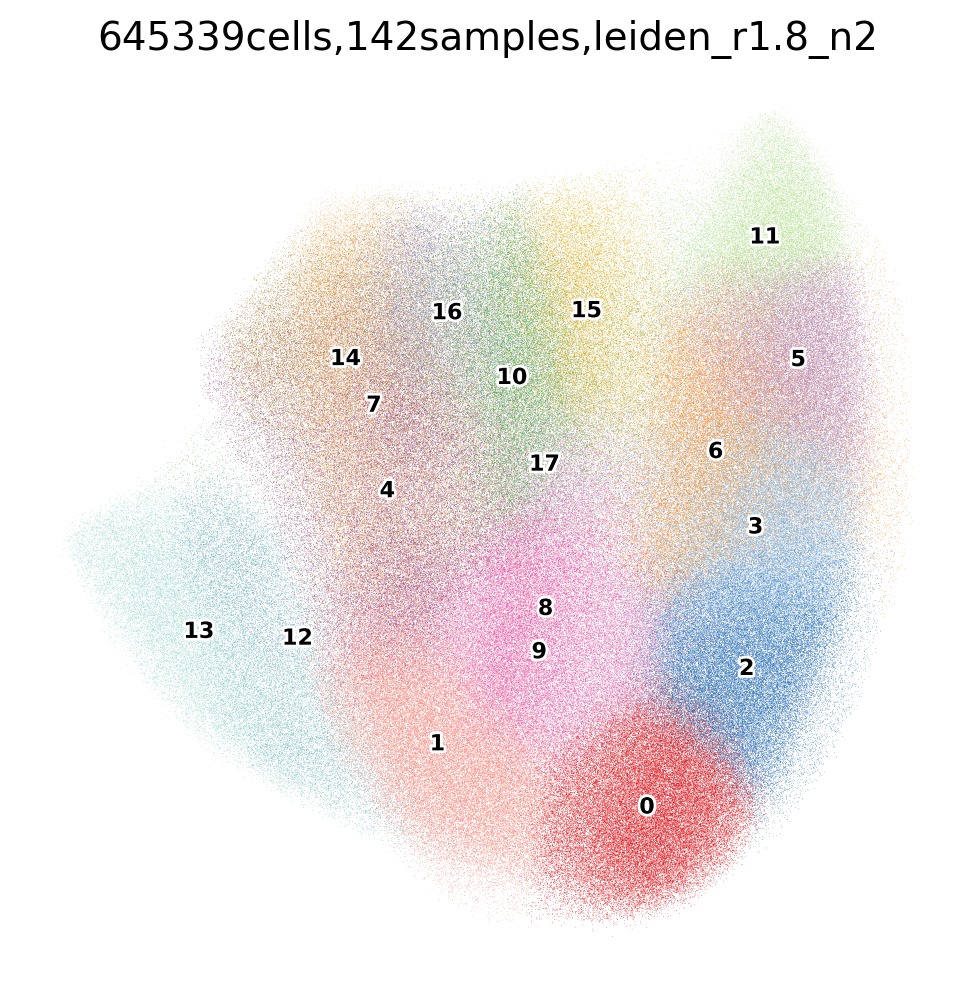

In [106]:
sc.tl.leiden(adata,resolution=1.8,n_iterations=2,key_added='leiden_r1.8_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r1.8_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='645339cells,142samples,leiden_r1.8_n2')

running Leiden clustering


IOStream.flush timed out


    finished: found 20 clusters and added
    'leiden_r2.0_n2', the cluster labels (adata.obs, categorical) (0:03:20)


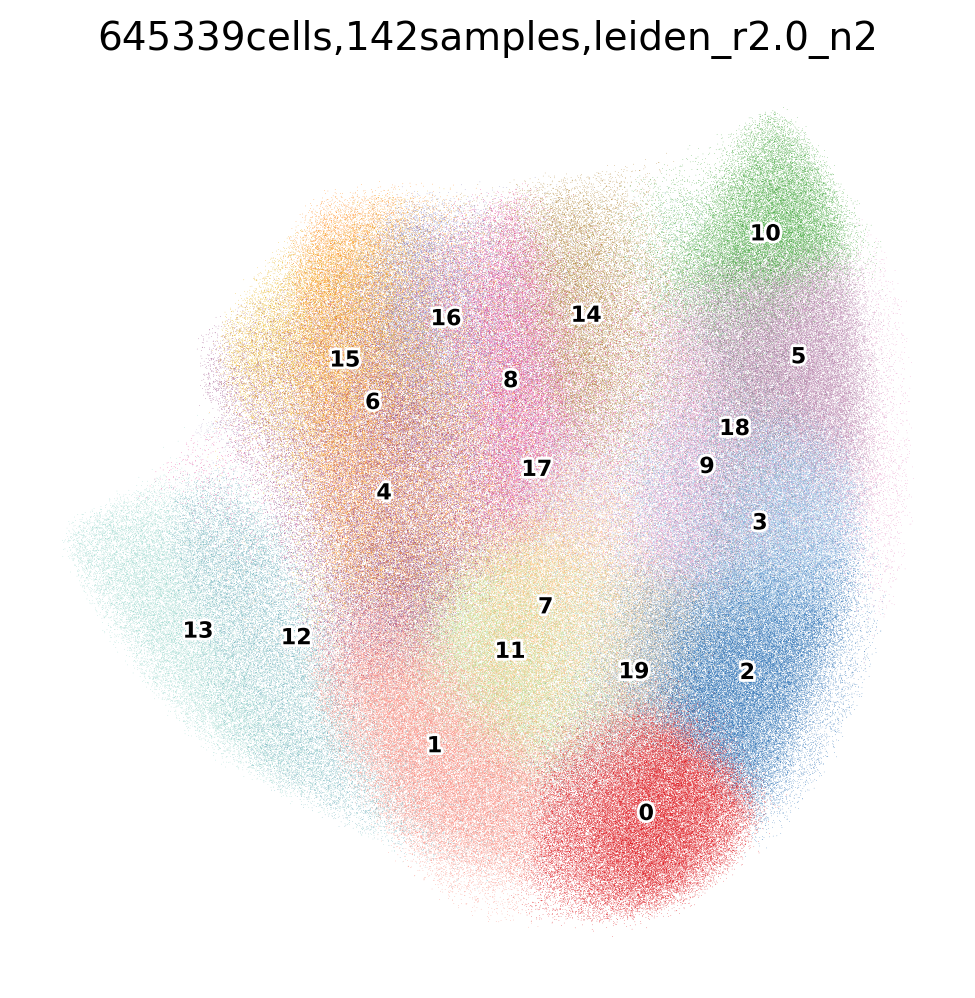

In [107]:
sc.tl.leiden(adata,resolution=2.0,n_iterations=2,key_added='leiden_r2.0_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.0_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='645339cells,142samples,leiden_r2.0_n2')

running Leiden clustering


IOStream.flush timed out


    finished: found 21 clusters and added
    'leiden_r2.2_n2', the cluster labels (adata.obs, categorical) (0:03:24)


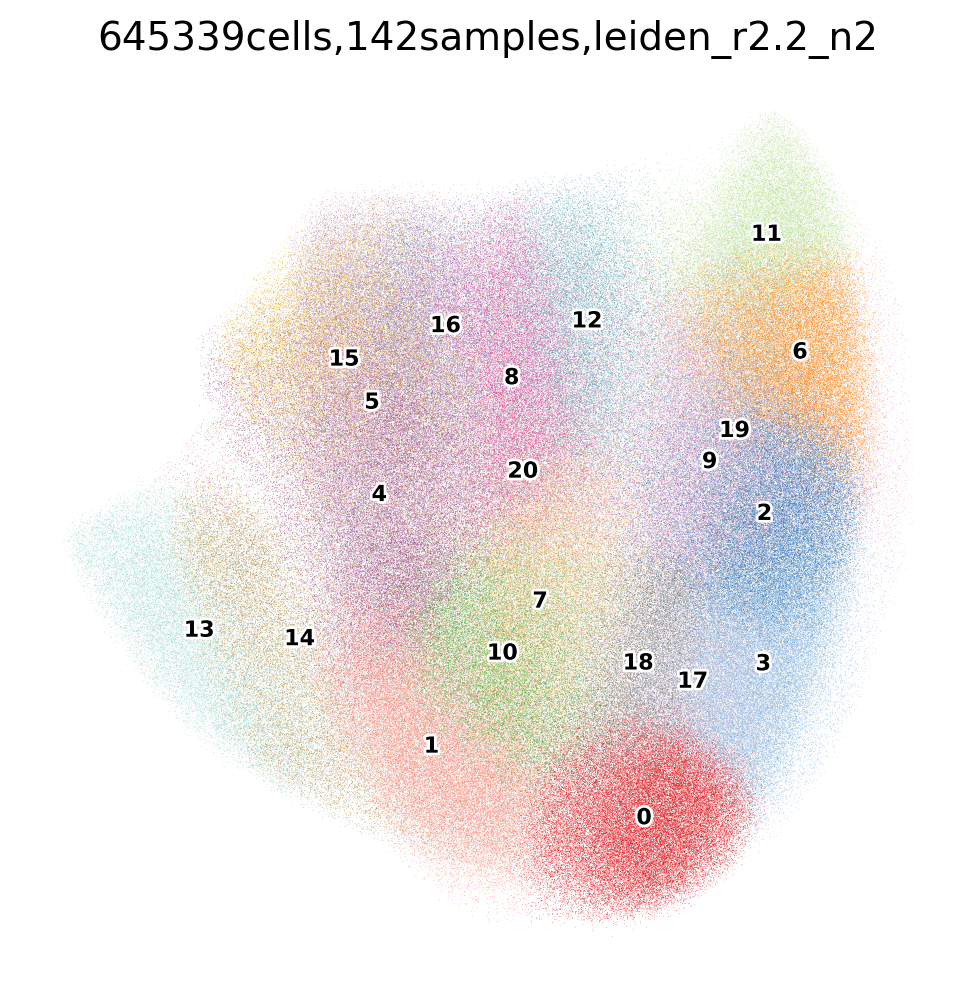

In [108]:
sc.tl.leiden(adata,resolution=2.2,n_iterations=2,key_added='leiden_r2.2_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.2_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='645339cells,142samples,leiden_r2.2_n2')

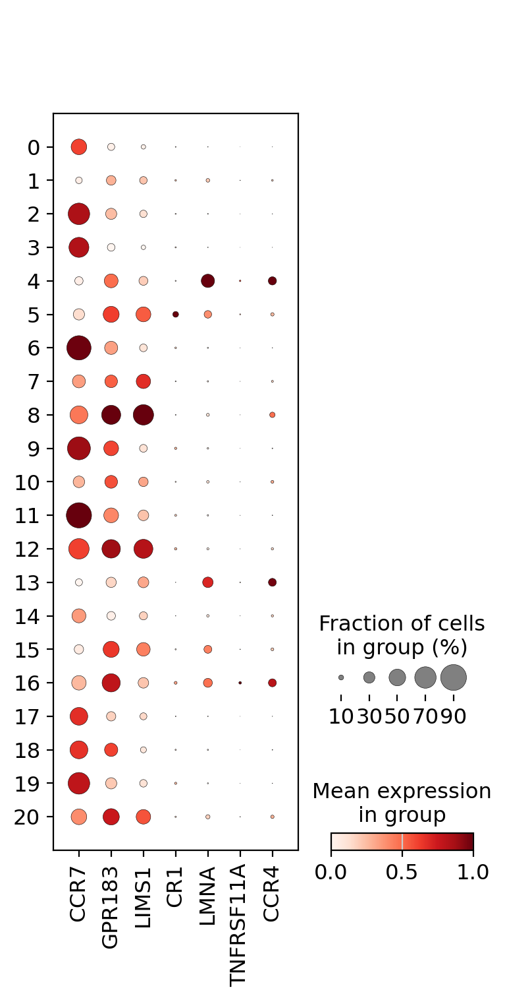

In [130]:
sc.pl.dotplot(adata, ["CCR7","GPR183",'LIMS1',"CR1","LMNA","TNFRSF11A","CCR4"], groupby='leiden_r2.2_n2',standard_scale='var')

### COSG

In [25]:
import cosg as cosg
import importlib
importlib.reload(cosg)

<module 'cosg' from '/home/yangshichen/mambaforge/envs/rsc/lib/python3.10/site-packages/cosg/__init__.py'>

In [26]:
cosg.cosg(adata,
    key_added='cosg',
    mu=1,
    n_genes_user=50,
    groupby='leiden_r2.2_n2')

**finished identifying marker genes by COSG**


In [27]:
colnames = ['names', 'scores']
test = [pd.DataFrame(adata.uns["cosg"][c]) for c in colnames]
test = pd.concat(test, axis=1, names=[None, 'group'], keys=colnames)

markers = {}
cats = adata.obs['leiden_r2.2_n2'].cat.categories
for i, c in enumerate(cats):
    cell_type_df = test.loc[:, 'names'][str(c)]
    scores_df = test.loc[:, 'scores'][str(c)]
    markers[str(c)] = cell_type_df.values.tolist()[:10]

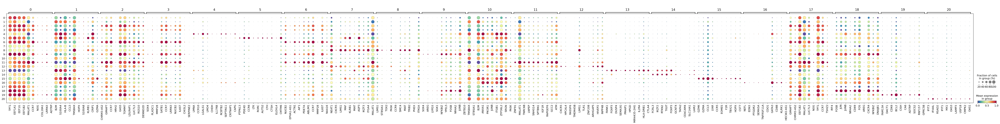

In [28]:
sc.pl.dotplot(adata, 
              var_names = markers, 
              groupby='leiden_r2.2_n2',
              cmap='Spectral_r',
              standard_scale='var',save='_leiden_r2.2_n2.pdf') 

In [29]:
marker_gene=pd.DataFrame(adata.uns['cosg']['names'])
marker_gene.head()

,0,1,10,11,12,13,14,15,16,17,...,19,2,20,3,4,5,6,7,8,9
0,TPT1,B2M,TMSB4X,ZNF91,CXCR5,FANK1,FCRL3,GZMK,NEFL,GIMAP7,...,FAM13A,CHRM3-AS2,IFIT3,SOX4,LMNA,PTPN13,NUCB2,NEAT1,LIMS1,SOX4
1,EEF1A1,S100A4,ST8SIA1,MALAT1,HPCAL4,FOXP3,IKZF2,GZMA,EDN3,CHRM3-AS2,...,DACT1,GIMAP7,IFI44L,PLXDC1,CCR10,PDE4D,EPHA1-AS1,CXCR5,ST8SIA1,AREG
2,EEF1G,HLA-B,B2M,TNRC6B,RASSF6,DUSP4,RTKN2,CCL5,PTGDR2,EEF1B2,...,CDK6,CCR7,RSAD2,MMP28,LGALS1,CCR6,ACTN1,LIMS1,TOX2,LYPD3
3,EEF1B2,CCL5,ANXA1,LNPEP,TMEM45B,SEMA3G,TIGIT,LYAR,SEMA5A,MALAT1,...,BCL2,HRH2,IFIT1,SATB1,LMO4,LTK,AIF1,MAF,PASK,SGK1
4,MALAT1,TMSB4X,PIK3R1,SNHG14,LIMS1,PMAIP1,FOXP3,CCR5,TNFRSF11A,LUC7L3,...,CISH,GAS5,MX1,CCR7,CHDH,RORC,PDE7A,KLRB1,CCR9,NFKBIZ


In [30]:
marker_gene.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/figures/_leiden_r2.2_n2_marker_gene.csv')

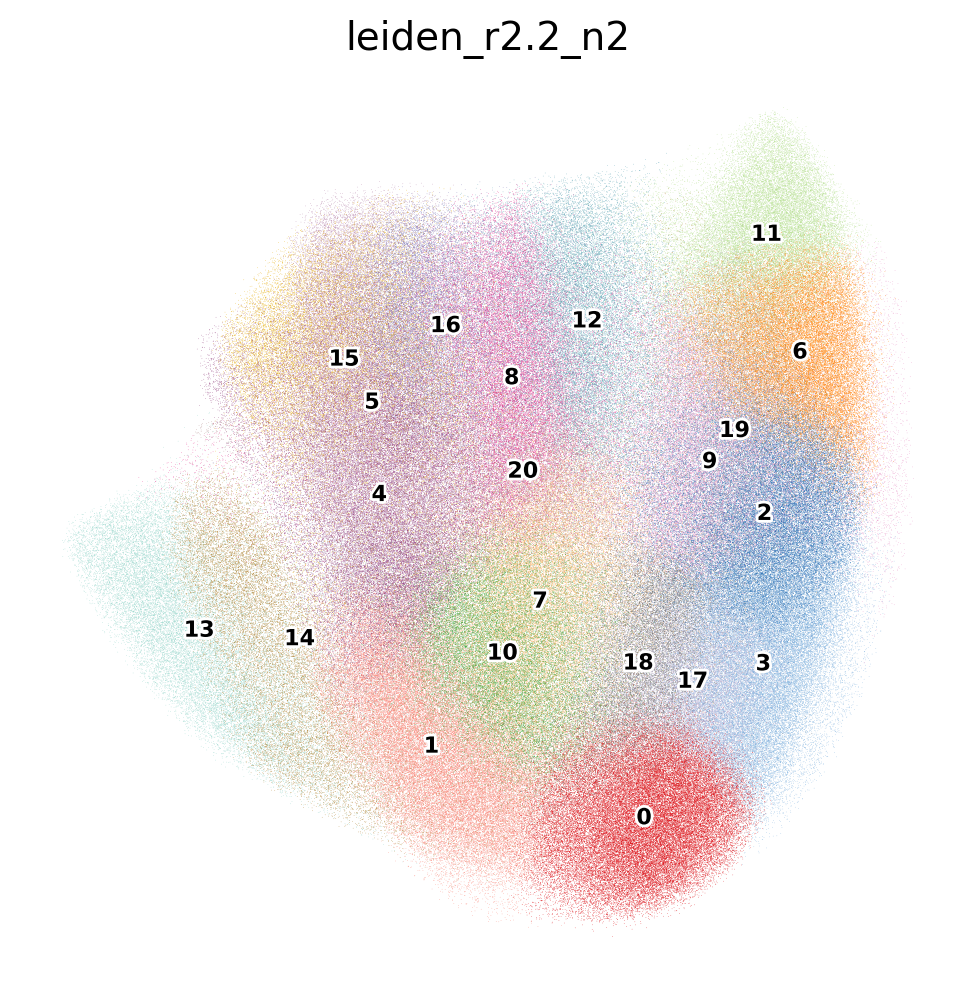

In [33]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=['leiden_r2.2_n2'],legend_loc="on data",
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

### 注释

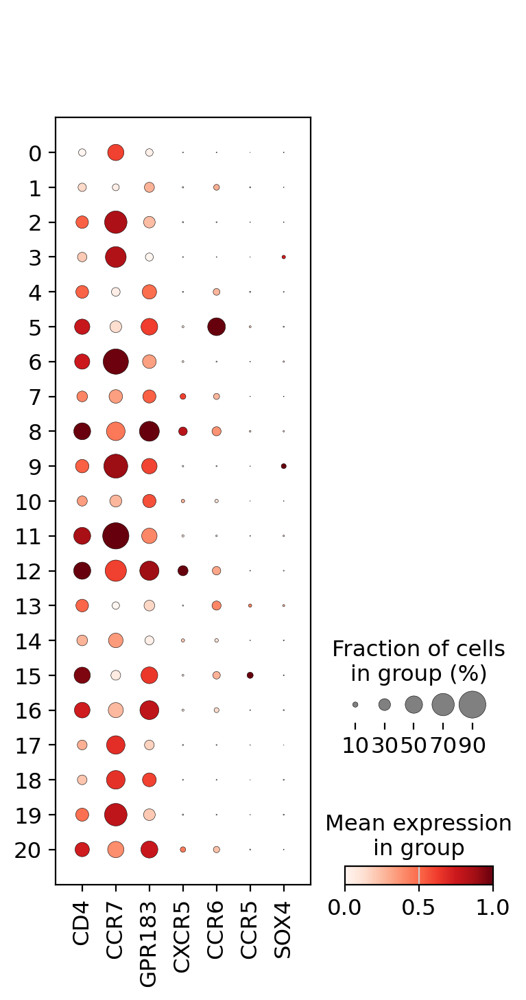

In [141]:
sc.pl.dotplot(adata, ["CD4","CCR7","GPR183","CXCR5","CCR6","CCR5",'SOX4'], groupby='leiden_r2.2_n2',standard_scale='var')

In [181]:
adata.obs = adata.obs.drop(['celltype_L3'],axis=1)
adata

AnnData object with n_obs × n_vars = 645339 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'celltype_L1', 'phase_ordered', 'leiden_r2.2_n2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'stage_colors', 'age_colors', 'experiments_colors', 'leiden', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_colors', 'leiden_r2.0_n2_colors', 'leiden_r2.2_n2_colors', 'cosg', 'rank_genes_groups', 'phase_ordered_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [182]:
new_cluster_names = ['CD4_Naive_T-CCR7','CD4_Tem-CCR7neg','CD4_Naive_T-CCR7',
                     'CD4_Naive_T-SOX4','CD4_Th22-CCR10','CD4_Th17-RORC','CD4_Naive_T-CCR7',
                     'CD4_Tcm-CXCR5','CD4_Tfh_like-CXCR5','CD4_Tcm-SOX4','CD4_Tcm-GPR183',
                     'CD4_Naive_T-CCR7','CD4_Tcm-CXCR5','CD4_Treg-FOXP3','CD4_Treg-FCRL3','CD4_Th1-GZMK',
                     'CD4_Th-TNFRSF11A','CD4_Naive_T-CCR7','CD4_Tcm-GPR183','CD4_Naive_T-CCR7',
                     'CD4_Tcm-IFIT3']
adata.obs['celltype_L3']=adata.obs['leiden_r2.2_n2'].replace(to_replace = list(adata.obs['leiden_r2.2_n2'].cat.categories.values),
                                                         value = new_cluster_names)

In [183]:
adata.obs['celltype_L3'].value_counts()

CD4_Naive_T-CCR7      197316
CD4_Tcm-CXCR5          62853
CD4_Tem-CCR7neg        49984
CD4_Tcm-GPR183         46187
CD4_Naive_T-SOX4       41228
CD4_Th22-CCR10         38442
CD4_Th17-RORC          37295
CD4_Tfh_like-CXCR5     31337
CD4_Tcm-SOX4           28546
CD4_Treg-FOXP3         26124
CD4_Treg-FCRL3         25902
CD4_Th1-GZMK           24034
CD4_Th-TNFRSF11A       22235
CD4_Tcm-IFIT3          13856
Name: celltype_L3, dtype: int64

In [184]:
phases = ['CD4_Naive_T-CCR7','CD4_Naive_T-SOX4','CD4_Tcm-GPR183','CD4_Tcm-SOX4',
          'CD4_Tcm-CXCR5','CD4_Tcm-IFIT3','CD4_Tem-CCR7neg','CD4_Tfh_like-CXCR5',
          'CD4_Th-TNFRSF11A','CD4_Th1-GZMK','CD4_Th17-RORC','CD4_Th22-CCR10','CD4_Treg-FOXP3',
          'CD4_Treg-FCRL3']
adata.obs["phase_ordered"] = pd.Categorical(values=adata.obs.celltype_L3, categories=phases, ordered=True)

In [204]:
CD4_colors={'CD4_Naive_T-CCR7':'#A7B0C2',
            'CD4_Naive_T-SOX4':'#8D9FB8',
            'CD4_Tcm-GPR183':'#7F9DAD',
            'CD4_Tcm-SOX4':'#AEC2D7',
            'CD4_Tcm-CXCR5':'#7C8CB2',
            'CD4_Tcm-IFIT3':'#3E436D',
            'CD4_Tem-CCR7neg':'#476485',
            'CD4_Tfh_like-CXCR5':'#557A90',
            'CD4_Th-TNFRSF11A':'#383857',
            'CD4_Th1-GZMK':'#4C5CB0',
            'CD4_Th17-RORC':'#557396',
            'CD4_Th22-CCR10':'#B3C5C8',
            'CD4_Treg-FOXP3':'#41578A',
            'CD4_Treg-FCRL3':'#7A8EA7'
}

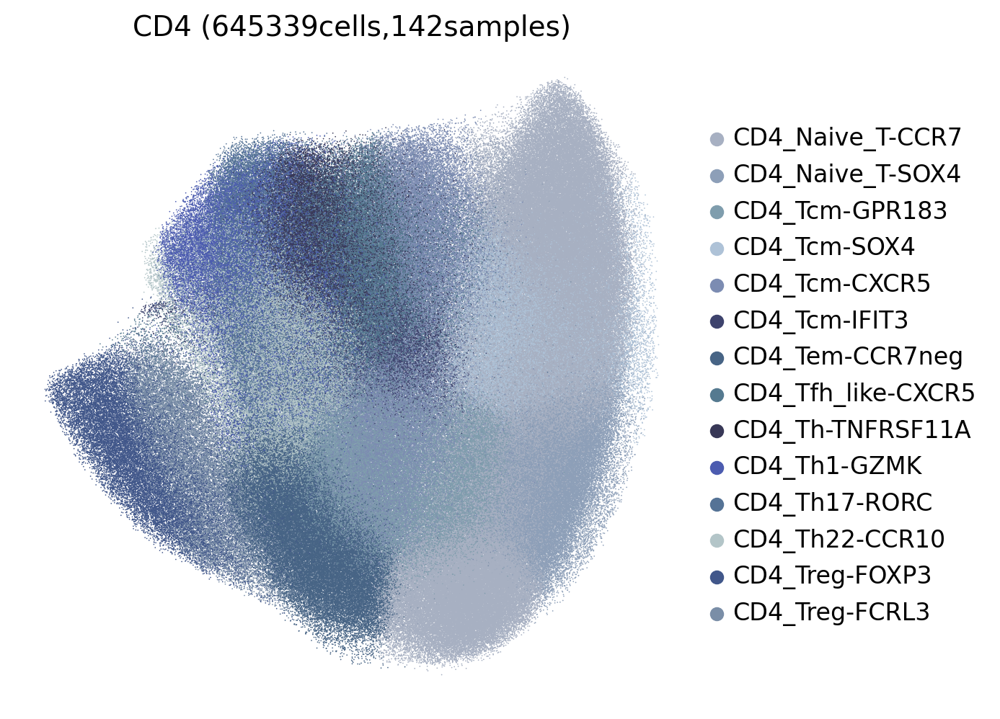

In [207]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['phase_ordered'],legend_fontsize=12,size=1.5,legend_fontoutline=2,
               palette=CD4_colors,title='CD4 (645339cells,142samples)',#legend_loc="on data",
               save='_CD4_celltype_L3.pdf')

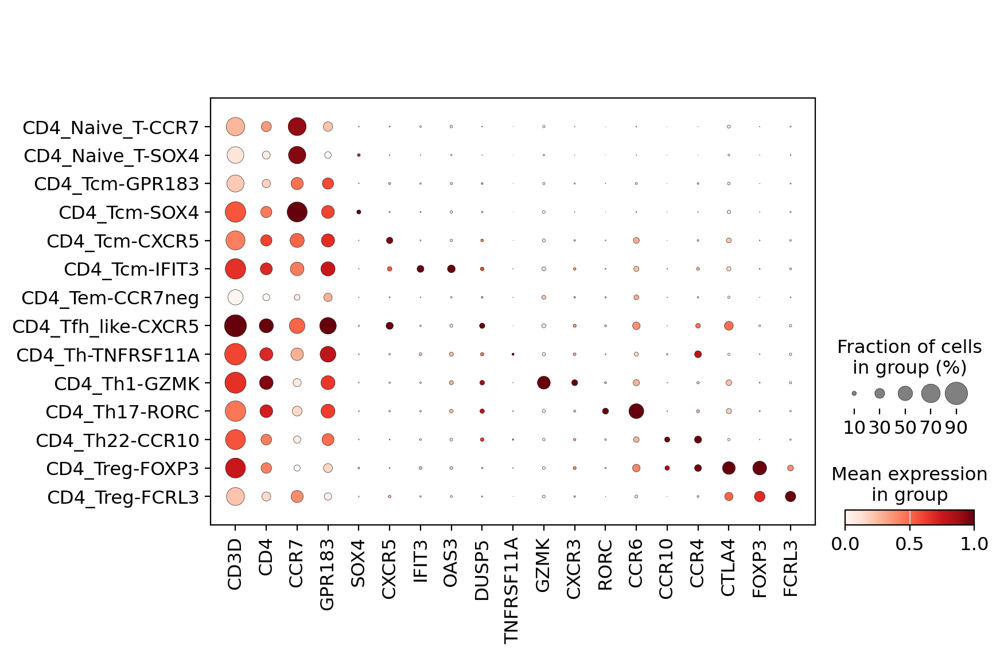

In [189]:
sc.pl.dotplot(adata, ["CD3D","CD4","CCR7","GPR183","SOX4","CXCR5","IFIT3",'OAS3',"DUSP5",
                     'TNFRSF11A','GZMK','CXCR3','RORC','CCR6','CCR10','CCR4','CTLA4','FOXP3','FCRL3'], 
              categories_order=['CD4_Naive_T-CCR7','CD4_Naive_T-SOX4','CD4_Tcm-GPR183','CD4_Tcm-SOX4',
                                'CD4_Tcm-CXCR5','CD4_Tcm-IFIT3','CD4_Tem-CCR7neg','CD4_Tfh_like-CXCR5',
                                'CD4_Th-TNFRSF11A','CD4_Th1-GZMK','CD4_Th17-RORC','CD4_Th22-CCR10',
                                'CD4_Treg-FOXP3','CD4_Treg-FCRL3'],standard_scale='var',
              groupby='celltype_L3',save='_CD4_celltype_L3.pdf')

In [209]:
adata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/CD4_celltype.h5ad')

### 细胞比例

In [210]:
# 计算每个样本中每种细胞类型的计数
cell_counts = adata.obs.groupby(['sample', 'celltype_L3']).size().reset_index(name='count')
# 计算每个样本中细胞类型的总计数
sample_totals = cell_counts.groupby('sample')['count'].sum().reset_index(name='total_count')
# 合并计数和总计数数据框
merged_data = pd.merge(cell_counts, sample_totals, on='sample')
# 计算每个样本中细胞类型的比例
merged_data['proportion'] = merged_data['count'] / merged_data['total_count']
# 输出结果
print(merged_data)
merged_data.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/proportions_L3.csv', index=False)

       sample       celltype_L3  count  total_count  proportion
0     HD-H134  CD4_Naive_T-CCR7   7030        15620    0.450064
1     HD-H134   CD4_Tem-CCR7neg   1577        15620    0.100960
2     HD-H134  CD4_Naive_T-SOX4    604        15620    0.038668
3     HD-H134    CD4_Th22-CCR10    813        15620    0.052049
4     HD-H134     CD4_Th17-RORC    656        15620    0.041997
...       ...               ...    ...          ...         ...
1983  PD-H308    CD4_Treg-FOXP3     66         3079    0.021436
1984  PD-H308    CD4_Treg-FCRL3     66         3079    0.021436
1985  PD-H308      CD4_Th1-GZMK     96         3079    0.031179
1986  PD-H308  CD4_Th-TNFRSF11A     86         3079    0.027931
1987  PD-H308     CD4_Tcm-IFIT3     88         3079    0.028581

[1988 rows x 5 columns]


In [218]:
# 计算每个样本中每种细胞类型的计数
cell_counts = adata.obs.groupby(['sample']).size().reset_index(name='count')
# 计算每个样本中细胞类型的总计数
sample_totals = cell_counts.groupby('sample')['count'].sum().reset_index(name='total_count')
# 合并计数和总计数数据框
merged_data = pd.merge(cell_counts, sample_totals, on='sample')
# 计算每个样本中细胞类型的比例
merged_data['proportion'] = merged_data['count'] / merged_data['total_count']
# 输出结果
print(merged_data)
merged_data.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/proportions_L1.csv', index=False)

      sample  count  total_count  proportion
0    HD-H134  15620        15620         1.0
1    HD-H135   8907         8907         1.0
2    HD-H136   6399         6399         1.0
3    HD-H137   3242         3242         1.0
4    HD-H138   6389         6389         1.0
..       ...    ...          ...         ...
137  PD-H302   4426         4426         1.0
138  PD-H305   3882         3882         1.0
139  PD-H306   2380         2380         1.0
140  PD-H307   2656         2656         1.0
141  PD-H308   3079         3079         1.0

[142 rows x 4 columns]


### DEG

In [3]:
adata=sc.read("/media/AnalysisDisk2/Yangshichen/0_HIV_RNA/HIV-pbmc/NK_celltype.h5ad")
adata

AnnData object with n_obs × n_vars = 204859 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'celltype_L1', 'phase_ordered', 'leiden_r2.2_n2', 'celltype_L3'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'cosg', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_colors', 'leiden_r2.0_n2_colors', 'leiden_r2.2_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'rank_genes_groups', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivitie

In [4]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,doublet,batch,sample,stage,...,total_counts_ncRNA,pct_counts_ncRNA,total_counts_LOC,pct_counts_LOC,total_counts_erccs,pct_counts_erccs,celltype_L1,phase_ordered,leiden_r2.2_n2,celltype_L3
cellbarcode,,,,,,,,,,,,,,,,,,,,,
HD-H134-1-CELL31_N1,1474,1473,3136,137,4.368622,0.044718,False,HD-H134-1,HD-H134,HDs,...,29,0.924745,8,0.255102,0,0.0,NK,NK_bright-XCL1,14,NK_bright-XCL1
HD-H134-1-CELL73_N2,2041,2041,4433,148,3.338597,0.111913,False,HD-H134-1,HD-H134,HDs,...,47,1.060230,16,0.360929,0,0.0,NK,Mature_NK_dim-FCGR3A,2,Mature_NK_dim-FCGR3A
HD-H134-1-CELL81_N1,1165,1165,2150,86,4.000000,0.003632,False,HD-H134-1,HD-H134,HDs,...,12,0.558140,5,0.232558,0,0.0,NK,Terminal_NK_dim-CD160neg,0,Terminal_NK_dim-CD160neg
HD-H134-1-CELL276_N1,894,894,1722,79,4.587689,0.004581,False,HD-H134-1,HD-H134,HDs,...,12,0.696864,9,0.522648,0,0.0,NK,NK_bright-XCL1,7,NK_bright-XCL1
HD-H134-1-CELL366_N2,2035,2034,4643,181,3.898342,0.140144,False,HD-H134-1,HD-H134,HDs,...,34,0.732285,13,0.279991,0,0.0,NK,Mature_NK_dim-FCGR3A,2,Mature_NK_dim-FCGR3A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PD-H267-1-CELL5710_N1,1277,1277,3022,174,5.757776,0.025574,False,PD-H267-1,PD-H267,IRs,...,17,0.562541,4,0.132363,0,0.0,NK,Mature_NK_dim-FCGR3A,6,Mature_NK_dim-FCGR3A
PD-H267-1-CELL7047_N1,1411,1411,2879,103,3.577631,0.044333,False,PD-H267-1,PD-H267,IRs,...,20,0.694686,3,0.104203,0,0.0,NK,Mature_NK_dim-FCGR3A,6,Mature_NK_dim-FCGR3A
PD-H267-2-CELL6066_N1,1227,1227,2749,133,4.838123,0.002539,False,PD-H267-2,PD-H267,IRs,...,33,1.200437,4,0.145507,0,0.0,NK,Mature_NK_dim-FCGR3A,6,Mature_NK_dim-FCGR3A


In [6]:
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
sc.tl.rank_genes_groups(adata, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
genes1 = sc.get.rank_genes_groups_df(adata, group='IRs', key='wilcoxon_HDs')
genes2 = sc.get.rank_genes_groups_df(adata, group='INRs', key='wilcoxon_HDs')
genes3 = sc.get.rank_genes_groups_df(adata, group='INRs', key='wilcoxon_IRs')
genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/DEG/NK_IRs_vs_HDs.csv', index=False)
genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/DEG/NK_INRs_vs_HDs.csv', index=False)
genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/DEG/NK_INRs_vs_IRs.csv', index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:20:10)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:07:46)


In [7]:
del adata

In [8]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/Myeloid_celltype.h5ad")
adata
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
sc.tl.rank_genes_groups(adata, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
genes1 = sc.get.rank_genes_groups_df(adata, group='IRs', key='wilcoxon_HDs')
genes2 = sc.get.rank_genes_groups_df(adata, group='INRs', key='wilcoxon_HDs')
genes3 = sc.get.rank_genes_groups_df(adata, group='INRs', key='wilcoxon_IRs')
genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/Myeloid/DEG/Myeloid_IRs_vs_HDs.csv', index=False)
genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/Myeloid/DEG/Myeloid_INRs_vs_HDs.csv', index=False)
genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/Myeloid/DEG/Myeloid_INRs_vs_IRs.csv', index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:48:14)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:19:30)


In [9]:
del adata

In [10]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/B_celltype.h5ad")
adata
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
sc.tl.rank_genes_groups(adata, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
genes1 = sc.get.rank_genes_groups_df(adata, group='IRs', key='wilcoxon_HDs')
genes2 = sc.get.rank_genes_groups_df(adata, group='INRs', key='wilcoxon_HDs')
genes3 = sc.get.rank_genes_groups_df(adata, group='INRs', key='wilcoxon_IRs')
genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/DEG/B_IRs_vs_HDs.csv', index=False)
genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/DEG/B_INRs_vs_HDs.csv', index=False)
genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/B/DEG/B_INRs_vs_IRs.csv', index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:37:09)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:11:12)


In [11]:
del adata

In [211]:
unique_celltypes = adata.obs['celltype_L3'].unique()
unique_celltypes

['CD4_Treg-FOXP3', 'CD4_Naive_T-CCR7', 'CD4_Tcm-CXCR5', 'CD4_Th22-CCR10', 'CD4_Th1-GZMK', ..., 'CD4_Th-TNFRSF11A', 'CD4_Th17-RORC', 'CD4_Tcm-IFIT3', 'CD4_Naive_T-SOX4', 'CD4_Tcm-SOX4']
Length: 14
Categories (14, object): ['CD4_Naive_T-CCR7', 'CD4_Tem-CCR7neg', 'CD4_Naive_T-SOX4', 'CD4_Th22-CCR10', ..., 'CD4_Treg-FCRL3', 'CD4_Th1-GZMK', 'CD4_Th-TNFRSF11A', 'CD4_Tcm-IFIT3']

In [212]:
for celltype in unique_celltypes:
    celltype_data = adata[adata.obs['celltype_L3'] == celltype, :]
    celltype_data.uns['log1p']['base']=None
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
    genes1 = sc.get.rank_genes_groups_df(celltype_data, group='IRs', key='wilcoxon_HDs')
    genes2 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_HDs')
    genes3 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_IRs')
    genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/DEG/{}_IRs_vs_HDs.csv'.format(celltype), index=False)
    genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/DEG/{}_INRs_vs_HDs.csv'.format(celltype), index=False)
    genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/CD4/DEG/{}_INRs_vs_IRs.csv'.format(celltype), index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:29)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:26)
ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group